## Import Modules

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings
import os
import random
from tensorflow.keras.preprocessing.image import load_img
warnings.filterwarnings('ignore')
from tensorflow.keras.preprocessing.image import ImageDataGenerator

## Create Dataframe for Input and Output

In [11]:
input_path = []
label = []

for class_name in os.listdir("PetImages"):
    for path in os.listdir("PetImages/"+class_name):
        if class_name == 'Cat':
            label.append(0)
        else:
            label.append(1)
        input_path.append(os.path.join(f"PetImages/{class_name}/{path}"))
print(input_path[0], label[0])

PetImages/Cat/0.jpg 0


In [12]:
df = pd.DataFrame()
df['images'] = input_path
df['label'] = label
df = df.sample(frac=1).reset_index(drop=True)
df.head()

,images,label
0,PetImages/Dog/10393.jpg,1
1,PetImages/Cat/2481.jpg,0
2,PetImages/Dog/4050.jpg,1
3,PetImages/Cat/5302.jpg,0
4,PetImages/Dog/3923.jpg,1


In [4]:
for i in df['images']:
    if '.jpg' not in i:
        print(i)

In [5]:
import PIL
l = []
for image in df['images']:
    try:
        img = PIL.Image.open(image)
    except:
        l.append(image)
l

['PetImages/Cat/666.jpg', 'PetImages/Dog/11702.jpg']

In [6]:
# delete unknown files
df = df[df['images']!='PetImages/Cat/666.jpg']
df = df[df['images']!='PetImages/Dog/11702.jpg']
len(df)

24998

## Exploratory Data Analysis

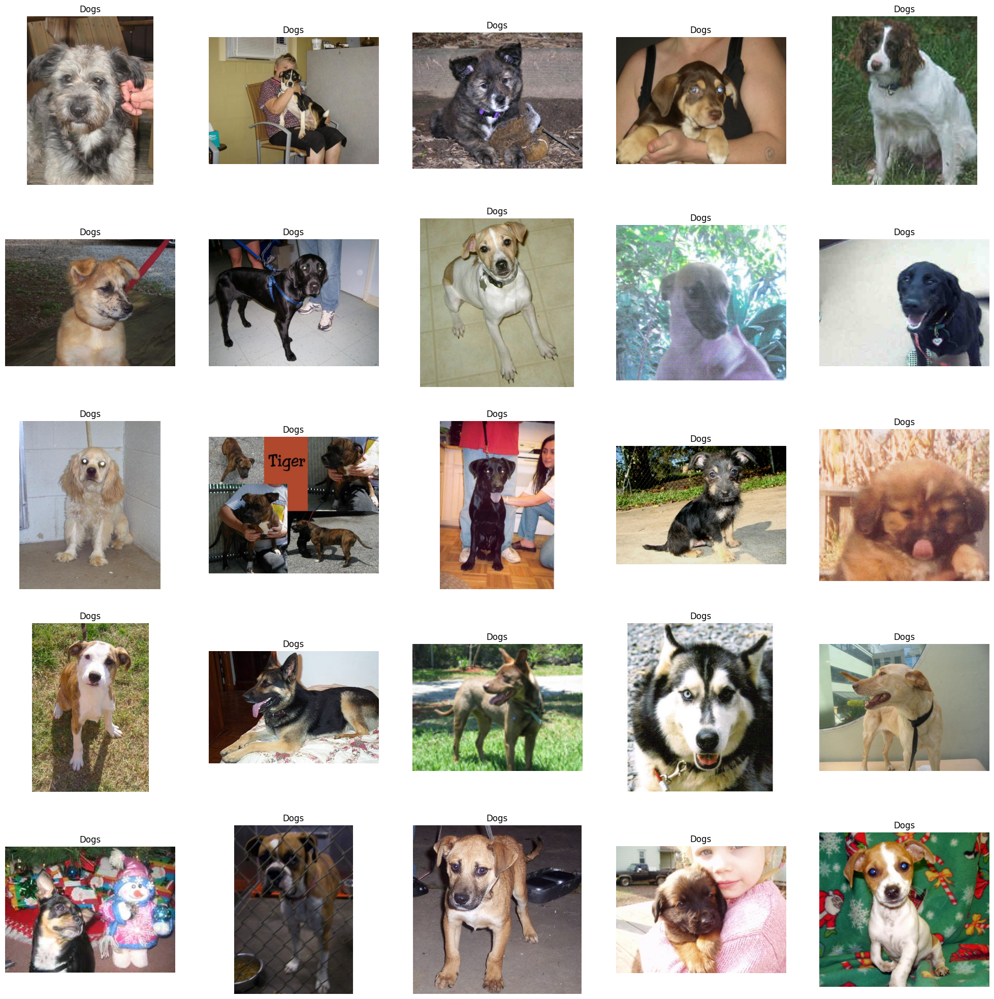

In [7]:

# to display grid of images
plt.figure(figsize=(25,25))
temp = df[df['label']==1]['images']
start = random.randint(0, len(temp))
files = temp[start:start+25]

for index, file in enumerate(files):
    plt.subplot(5,5, index+1)
    img = load_img(file)
    img = np.array(img)
    plt.imshow(img)
    plt.title('Dogs')
    plt.axis('off')

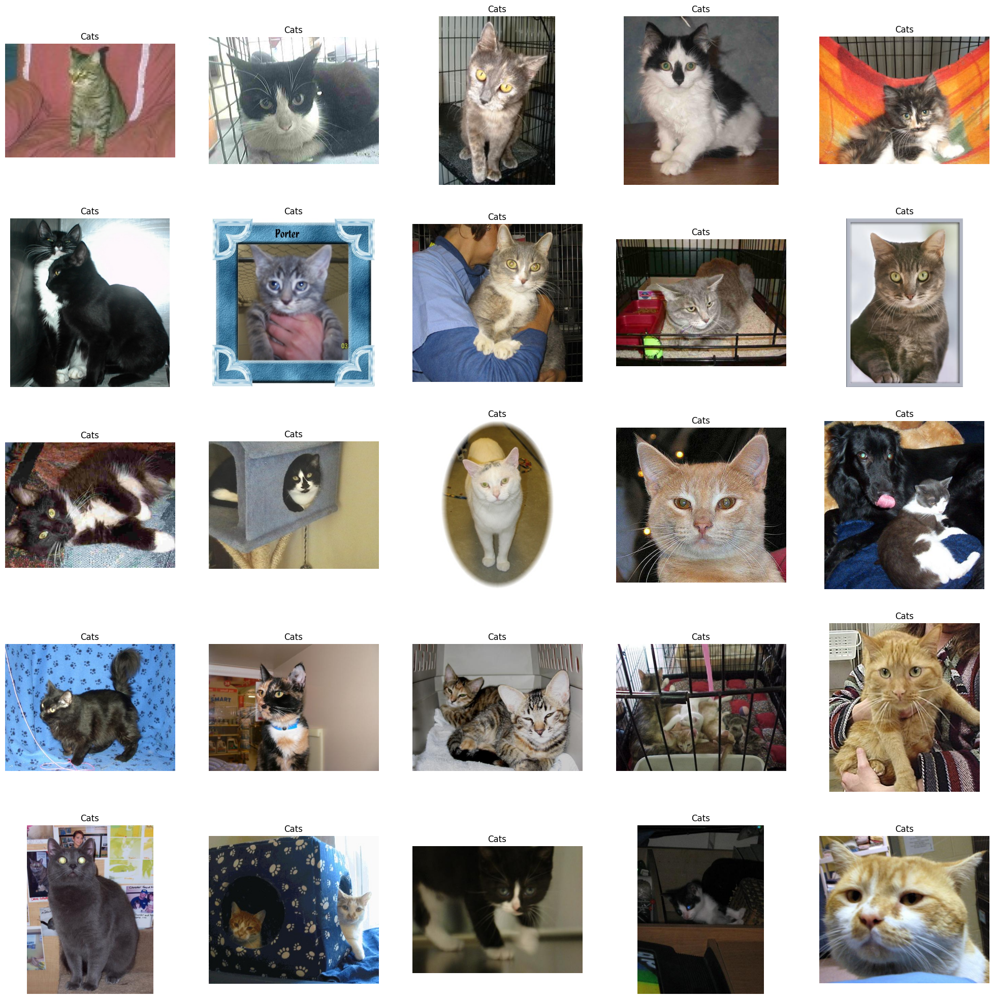

In [8]:
# to display grid of images
plt.figure(figsize=(25,25))
temp = df[df['label']==0]['images']
start = random.randint(0, len(temp))
files = temp[start:start+25]

for index, file in enumerate(files):
    plt.subplot(5,5, index+1)
    img = load_img(file)
    img = np.array(img)
    plt.imshow(img)
    plt.title('Cats')
    plt.axis('off')

<Axes: xlabel='label', ylabel='count'>

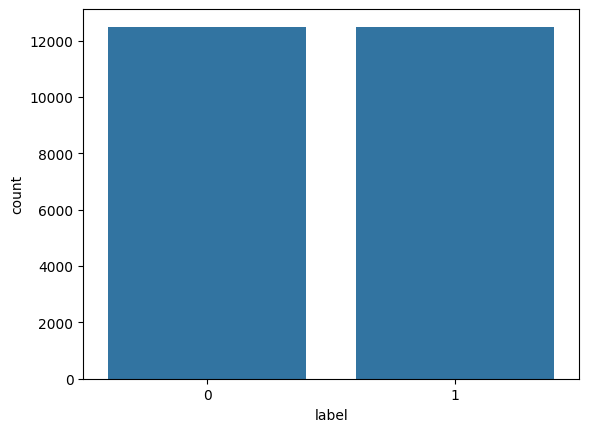

In [9]:
import seaborn as sns
sns.countplot(x =df['label'], data = df)

## Create DataGenerator for the Images

In [10]:
df['label'] = df['label'].astype('str')

In [11]:
df.head()

,images,label
0,PetImages/Cat/7736.jpg,0
1,PetImages/Dog/9436.jpg,1
2,PetImages/Dog/5905.jpg,1
3,PetImages/Cat/3730.jpg,0
4,PetImages/Dog/6029.jpg,1


In [12]:
# input split
from sklearn.model_selection import train_test_split
train, test = train_test_split(df, test_size=0.2, random_state=42)

In [13]:

train_generator = ImageDataGenerator(
    rescale = 1./255,  # normalization of images
    rotation_range = 40, # augmention of images to avoid overfitting
    shear_range = 0.2,
    zoom_range = 0.2,
    horizontal_flip = True,
    fill_mode = 'nearest'
)

val_generator = ImageDataGenerator(rescale = 1./255)

train_iterator = train_generator.flow_from_dataframe(
    train, 
    x_col='images', 
    y_col='label', 
    target_size=(128,128), 
    batch_size=512, 
    class_mode='binary'
)

val_iterator = val_generator.flow_from_dataframe(
    test, 
    x_col='images', 
    y_col='label', 
    target_size=(128,128), 
    batch_size=512, 
    class_mode='binary'
)

Found 19998 validated image filenames belonging to 2 classes.
Found 5000 validated image filenames belonging to 2 classes.


## Model Creation

In [14]:

from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense
from tensorflow.keras.models import Sequential, load_model

model = Sequential([
                    Conv2D(16, (3,3), activation='relu', input_shape=(128,128,3)),
                    MaxPooling2D((2,2)),
                    Conv2D(32, (3,3), activation='relu'),
                    MaxPooling2D((2,2)),
                    Conv2D(64, (3,3), activation='relu'),
                    MaxPooling2D((2,2)),
                    Flatten(),
                    Dense(512, activation='relu'),
                    Dense(1, activation='sigmoid')
])

In [15]:
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
model.summary()


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 126, 126, 16)      448       
                                                                 
 max_pooling2d (MaxPooling2  (None, 63, 63, 16)        0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 61, 61, 32)        4640      
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 30, 30, 32)        0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 28, 28, 64)        18496     
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 14, 14, 64)        

In [16]:
history = model.fit(train_iterator, epochs=10, validation_data=val_iterator)

Epoch 1/10


40/40 [==============================] - 310s 8s/step - loss: 0.7310 - accuracy: 0.5301 - val_loss: 0.6591 - val_accuracy: 0.6002
Epoch 2/10
40/40 [==============================] - 312s 8s/step - loss: 0.6449 - accuracy: 0.6177 - val_loss: 0.6085 - val_accuracy: 0.6644
Epoch 3/10
40/40 [==============================] - 318s 8s/step - loss: 0.6087 - accuracy: 0.6621 - val_loss: 0.6286 - val_accuracy: 0.6362
Epoch 4/10
40/40 [==============================] - 297s 7s/step - loss: 0.5806 - accuracy: 0.6908 - val_loss: 0.5447 - val_accuracy: 0.7290
Epoch 5/10
40/40 [==============================] - 334s 8s/step - loss: 0.5527 - accuracy: 0.7152 - val_loss: 0.5204 - val_accuracy: 0.7416
Epoch 6/10
40/40 [==============================] - 299s 7s/step - loss: 0.5321 - accuracy: 0.7326 - val_loss: 0.5710 - val_accuracy: 0.7014
Epoch 7/10
40/40 [==============================] - 324s 8s/step - loss: 0.5243 - accuracy: 0.7352 - val_loss: 0.5060 - val_accuracy: 0.7428
Epoch 8/10


## Visualization of Results

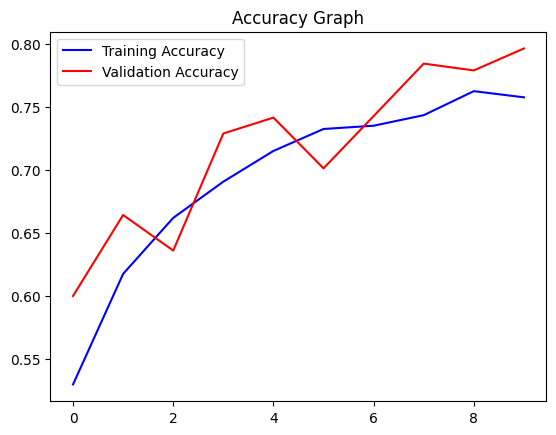

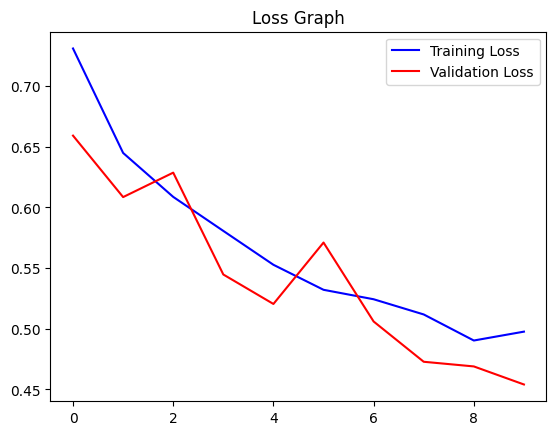

In [17]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
epochs = range(len(acc))

plt.plot(epochs, acc, 'b', label='Training Accuracy')
plt.plot(epochs, val_acc, 'r', label='Validation Accuracy')
plt.title('Accuracy Graph')
plt.legend()
plt.figure()

loss = history.history['loss']
val_loss = history.history['val_loss']
plt.plot(epochs, loss, 'b', label='Training Loss')
plt.plot(epochs, val_loss, 'r', label='Validation Loss')
plt.title('Loss Graph')
plt.legend()
plt.show()

In [18]:
model.save("cat_dog_cnn_model.h5")
print("Model Saved Successfully!")

Model Saved Successfully!


In [19]:
model = load_model("cat_dog_cnn_model.h5")
print("Model Loaded Successfully!")

Model Loaded Successfully!


## Test with Real Image

In [21]:
image_path = "cat.jpg" 
img = load_img(image_path, target_size=(128, 128))
img = np.array(img)
img = img / 255.0 # normalize the image
img = img.reshape(1, 128, 128, 3) # reshape for prediction
pred = model.predict(img)
if pred[0] > 0.5:
    label = 'Dog'
else:
    label = 'Cat'
print(label)

1/1 [==============================] - 0s 68ms/step
Cat
